In [1]:
from util_comp import *
from scipy.cluster.hierarchy import dendrogram , linkage , fcluster
from sklearn.preprocessing import StandardScaler

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

# Makes sure we see all columns
pd.set_option('display.max_columns', None)

In [2]:
# get data without MICE imputation
data = main(retained=True)
data.head()

Elapsed time to compute age categorisation: 0 minutes and 0 seconds
Elapsed time to compute correct systematic error: 0 minutes and 11 seconds
Elapsed time to compute load column names: 0 minutes and 0 seconds
Elapsed time to compute clean data: 0 minutes and 0 seconds
Elapsed time to compute categorisation of outcome column: 0 minutes and 3 seconds
Elapsed time to compute change values in catagorical columns: 1 minutes and 50 seconds
Elapsed time to compute Full process: 2 minutes and 4 seconds


,YEAR MMS,Q1- Your sex?,Q2- How old are you?,STATUS,In which sector of activity do you work?,"What is the size of your business (in total, all locations combined)? 2009 fake","Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you?","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?","Would you say that over the last 12 months, your company's activity has:",Q9- Are you working?,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?",Q12- Do you work most often?,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures,Q13- Is the performance of your work taxing on you?-To work on screen,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat,Q13- Is the performance of your work taxing on you?-To work in noise,"Q14- During your work, are you in a situation? (Of-breathe toxic products or dust","Q14- During your work, are you in a situation? (Of-handle toxic or dangerous products","Q14- During your work, are you in a situation? (Of-risk a serious fall","Q14- During your work, are you in a situation? (Of-working on machinery that could expose you to injury",Q15- Indicate whether each of the following sentences suits you-My work allows me to learn new things,Q15- Indicate whether each of the following sentences suits you-My job requires working very quickly or very intensely,Q15- Indicate whether each of the following sentences suits you-My job requires long periods of concentration,Q15- Indicate whether each of the following sentences suits you-My job is physically tiring,Q15- Indicate whether each of the following sentences suits you-My work is nervously tiring,Q15- Indicate whether each of the following sentences suits you-I am satisfied with my work,Q15- Indicate whether each of the following sentences suits you-In my job I have the opportunity to make decisions,"Q15- Indicate whether each of the following sentences suits you-At times, I have difficulty managing priorities",Q15- Indicate whether each of the following sentences suits you-I feel recognized by my hierarchy,Q15- Indicate whether each of the following sentences suits you-I have the opportunity to develop my professional skills,Q15- Indicate whether each of the following sentences suits you-There is good understanding where I work,Q15- Indicate whether each of the following sentences suits you-I have a well-suited workstation,Q15- Indicate whether each of the following sentences suits you-I systematically seek to improve the way I work,Q15- Indicate whether each of the following sentences suits you-My company takes care of the well-being of its employees,Q15- Indicate whether each of the following sentences suits you-Security is a priority for my business,"Q15- Indicate whether each of the following sentences suits you-In the event of a problem, I can count on my supervisor","Would you say that over the last 12 months, your pace of work has:",Q16- And for each of these sentences?-I would recommend my company to a friend,Q16- And for each of these sentences?-I am proud to work in my company,"Q17- At work, does it happen to you: (D-have decreased alertness, lack of attention","Q17- At work, does it happen to you: (D-e receiving hurtful or aggressive remarks within the company","Q17- At 

In [3]:
data.shape

(44535, 100)

In [4]:
# remove all rows with YEAR MMS is 1 and 10

data = data[(data['YEAR MMS'] != 1) & (data['YEAR MMS'] != 10)]
data.shape

(37681, 100)

In [5]:
data_copy = data.copy()

In [6]:
data = data_copy.copy()

In [7]:
colNames

,VAGUE,Q1,Q2,STATUTTV,SECTEUR,TAILLE,Q4_3A6,Q4_7A12,Q4_13A17,Q4_SUP18,Q5,EVACTENT,Q9,Q10,Q12,Q13_1,Q13_2,Q13_4,Q13_5,Q13_6,Q13_7,Q14_1,Q14_2,Q14_3,Q14_4,Q15_1,Q15_3,Q15_4,Q15_5,Q15_6,Q15_7,Q15_8,Q15_9,Q15_10,Q15_11,Q15_12,Q15_13,Q15_14,Q15_17,Q15_18,Q15_19,EVRYTHM,Q16_3,Q16_4,Q17_1,Q17_3,Q17_4,Q19_1,Q19_2,Q19_3,Q19_4,Q19_5,Q19_6,Q19_7,Q19_8,Q19_9,Q19_10,Q19_11,Q19_12,Q19_13,Q19_14,Q19_15,Q19_16,Q19_17,Q22_1,Q22_2,Q22_3,Q22_4,Q22_5,Q23_1,Q25,Q31_1,Q31_2,Q31_3,Q31_4,Q31_5,Q31_6,Q34_1,Q34_2,Q34_3,Q34_4,Q37,Q38_1,Q38_2,Q40M3JR,Q403A5JR,Q401SEMR,Q40SU1MR,Q40SU3M,Q42,Q44_1,Q44_2,Q44_3,Q44_4,Q44_5,Q44_6,Q57,Q58_1,Q58_2,Q60,Q61,Q62,Q63_1,Q63_2,outcome
Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Q_En,YEAR MMS,Q1- Your sex?,Q2- How old are you?,STATUS,In which sector of activity do you work?,"What is the size of your business (in total, a...",Q4- (3 to 6 years old) In each of the followin...,Q4- (7 to 12 years old) In each of the followi...,Q4- (13 to 17 years old) In each of the follow...,Q4- (18 years and over) In each of the followi...,"Q5- Apart from your children, do you have a de...","Would you say that over the last 12 months, yo...",Q9- Are you working?,Q10- Do you have shift work (work organized in...,Q12- Do you work most often?,Q13- Is the performance of your work taxing on...,Q13- Is the performance of your work taxing on...,Q13- Is the performance of your work taxing on...,Q13- Is the performance of your work taxing on...,Q13- Is the performance of your work taxing on...,Q13- Is the performance of your work taxing on...,"Q14- During your work, are you in a situation?...","Q14- During your work, are you in a situation?...","Q14- During your work, are you in a situation?...","Q14- During your work, are you in a situation?...",Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,Q15- Indicate whether each of the following se...,"Would you say that over the last 12 months, yo...",Q16- And for each of these sentences?-I would ...,Q16- And for each of these sentences?-I am pro...,"Q17- At work, does it happen to you: (D-have d...","Q17- At work, does it happen to you: (D-e rece...","Q17- At work, does it happen to you: (D-being ...",Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q19- For each of the following points indicate...,Q22- Over the last 12 months have you personal...,Q22- Over the last 12 months have you personal...,Q22- Over the last 12 months have you personal...,Q22- Over the last 12 months have you personal...,Q22- Over the last 

In [8]:
# get the data from retained.csv

retained_cols

,0
0,VAGUE
1,Q1
2,Q2
3,Q2_2016
4,Q3
...,...
75,Q401SEMR
76,Q40SU1MR
77,Q40SU3M
78,TAILLE


In [9]:
# get the long term retained columns
retained_long_cols = []
for col in retained_cols[0]:
    for short_col in colNames.columns:
        if col == short_col:
            retained_long_cols.append(colNames[short_col][0])
retained_long_cols[0].split("'")[0]

'YEAR MMS'

In [10]:
# remove the columns that are not in the retained_long_cols

for col in data.columns:
    if col == 'outcome':
        continue
    if col not in retained_long_cols:
        data = data.drop(col, axis=1)

In [11]:
data.head()

,YEAR MMS,Q1- Your sex?,Q2- How old are you?,STATUS,In which sector of activity do you work?,"What is the size of your business (in total, all locations combined)? 2009 fake","Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you?","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?",Q9- Are you working?,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?",Q12- Do you work most often?,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures,Q13- Is the performance of your work taxing on you?-To work on screen,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat,Q13- Is the performance of your work taxing on you?-To work in noise,"Q14- During your work, are you in a situation? (Of-breathe toxic products or dust","Q14- During your work, are you in a situation? (Of-handle toxic or dangerous products","Q14- During your work, are you in a situation? (Of-risk a serious fall","Q14- During your work, are you in a situation? (Of-working on machinery that could expose you to injury",Q15- Indicate whether each of the following sentences suits you-My work allows me to learn new things,Q15- Indicate whether each of the following sentences suits you-My job requires working very quickly or very intensely,Q15- Indicate whether each of the following sentences suits you-My job requires long periods of concentration,Q15- Indicate whether each of the following sentences suits you-My job is physically tiring,Q15- Indicate whether each of the following sentences suits you-My work is nervously tiring,Q15- Indicate whether each of the following sentences suits you-I am satisfied with my work,Q15- Indicate whether each of the following sentences suits you-In my job I have the opportunity to make decisions,"Q15- Indicate whether each of the following sentences suits you-At times, I have difficulty managing priorities",Q15- Indicate whether each of the following sentences suits you-I feel recognized by my hierarchy,Q15- Indicate whether each of the following sentences suits you-I have the opportunity to develop my professional skills,Q15- Indicate whether each of the following sentences suits you-There is good understanding where I work,Q15- Indicate whether each of the following sentences suits you-I have a well-suited workstation,Q15- Indicate whether each of the following sentences suits you-I systematically seek to improve the way I work,Q15- Indicate whether each of the following sentences suits you-My company takes care of the well-being of its employees,Q15- Indicate whether each of the following sentences suits you-Security is a priority for my business,"Q15- Indicate whether each of the following sentences suits you-In the event of a problem, I can count on my supervisor",Q16- And for each of these sentences?-I would recommend my company to a friend,"Q17- At work, does it happen to you: (D-have decreased alertness, lack of attention","Q17- At work, does it happen to you: (D-e receiving hurtful or aggressive remarks within the company","Q17- At work, does it happen to you: (D-being insulted or attacked by the public or customers","Q19- For each of the following points indicate whether, in your work, you find it satisfactory or unsatisfactory: (L-clarity of

In [12]:
data.shape

(37681, 68)

In [13]:
# outcome counts

data['outcome'].value_counts()

0    24060
3     5662
1     4698
2     3261
Name: outcome, dtype: int64

In [14]:
# show nan values
for col in data.columns:
    print(col, data[col].isnull().sum())

YEAR MMS 0
Q1- Your sex? 34
Q2- How old are you? 39
STATUS 2
In which sector of activity do you work? 2
What is the size of your business (in total, all locations combined)? 2009 fake 26
Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you? 0
Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you? 1
Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you? 0
Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you? 0
Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly? 52
Q9- Are you working? 69
Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours? 121
Q12- Do you work most often? 304
Q13- Is the performance of your work 

In [15]:
# create an empty list to store the first 5 characters of the column names called five_chars
# loop through the columns 
    # take the first 5 characters of column name
    # if its not in the five_chars list, add it to the list
    # if its already in the five_chars list, then put it in to another variable called multi_col
# loop through all the columns again and get all the columns that have the same first 5 characters as multi_col
    # loop through each row of those columns and check if all the values are nan
        # if all the values in the row are nan, then drop the row
        # if there is even one value that is not nan in that row, then keep the row
        # fill the nan values of that row with 0

five_chars = []
multi_col = []

for col in data.columns:
    first_five = col[:5]
    if first_five not in five_chars:
        five_chars.append(first_five)
    else:
        if first_five not in multi_col:
            multi_col.append(first_five)

for col2 in multi_col:
    all_cols_with_same_first_five = []

    for col_name in data.columns:
        if col2 in col_name:
            all_cols_with_same_first_five.append(col_name)

    for index, row in data.iterrows():
        all_nans = True
        for col_name2 in all_cols_with_same_first_five:
            if not pd.isnull(row[col_name2]):
                all_nans = False
                break
        if all_nans:
            data.drop(index, inplace=True)
        else:
            for col_name3 in all_cols_with_same_first_five:
                if pd.isnull(row[col_name3]):
                    data.at[index, col_name3] = 0
                    


In [16]:
# show nan values
for col in data.columns:
    print(col, data[col].isnull().sum())

YEAR MMS 0
Q1- Your sex? 0
Q2- How old are you? 26
STATUS 0
In which sector of activity do you work? 0
What is the size of your business (in total, all locations combined)? 2009 fake 11
Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you? 0
Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you? 0
Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you? 0
Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you? 0
Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly? 23
Q9- Are you working? 43
Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours? 94
Q12- Do you work most often? 242
Q13- Is the performance of your work ta

In [17]:
data.shape

(32492, 68)

In [18]:
x = data.shape[0] - 32327
x

165

In [19]:
# show nan values
for col in data.columns:
    if data[col].isnull().sum() >= x:
        print(col, data[col].isnull().sum())

Q12- Do you work most often? 242
Q16- And for each of these sentences?-I would recommend my company to a friend 5022
Q58- For each of these drinks, indicate whether you consume them:-At least once a week 5868


In [20]:
# value counts of Q16- And for each of these sentences?-I would recommend my company to a friend
data['Q16- And for each of these sentences?-I would recommend my company to a friend'].value_counts()

Rather         13194
Rather not      6775
Completetly     4182
Not at all      3319
Name: Q16- And for each of these sentences?-I would recommend my company to a friend, dtype: int64

In [21]:
# convert all nan values of Q16- And for each of these sentences?-I would recommend my company to a friend to 0
data['Q16- And for each of these sentences?-I would recommend my company to a friend'] = data['Q16- And for each of these sentences?-I would recommend my company to a friend'].fillna(0)

In [22]:
data['Q58- For each of these drinks, indicate whether you consume them:-At least once a week'].value_counts()

Energy drinks (like Red Bull or Monster)    12515
Alcoholic beverages                         11566
Sodas                                        2543
Name: Q58- For each of these drinks, indicate whether you consume them:-At least once a week, dtype: int64

In [23]:
# convert all nan values of Q58- For each of these drinks, indicate whether you consume them:-At least once a week to 0
data['Q58- For each of these drinks, indicate whether you consume them:-At least once a week'] = data['Q58- For each of these drinks, indicate whether you consume them:-At least once a week'].fillna(0)

In [24]:
# convert all nan values of Q12- Do you work most often? to 0
data['Q12- Do you work most often?'] = data['Q12- Do you work most often?'].fillna(0)

In [25]:
# drop the rows with nan values 
data = data.dropna()
data.shape

(31666, 68)

In [26]:
data['outcome'].value_counts()

0    20899
3     4498
1     3700
2     2569
Name: outcome, dtype: int64

In [27]:
data.drop('YEAR MMS', axis=1, inplace=True)

In [28]:
data.tail()

,Q1- Your sex?,Q2- How old are you?,STATUS,In which sector of activity do you work?,"What is the size of your business (in total, all locations combined)? 2009 fake","Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you?","Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you?","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?",Q9- Are you working?,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?",Q12- Do you work most often?,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures,Q13- Is the performance of your work taxing on you?-To work on screen,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat,Q13- Is the performance of your work taxing on you?-To work in noise,"Q14- During your work, are you in a situation? (Of-breathe toxic products or dust","Q14- During your work, are you in a situation? (Of-handle toxic or dangerous products","Q14- During your work, are you in a situation? (Of-risk a serious fall","Q14- During your work, are you in a situation? (Of-working on machinery that could expose you to injury",Q15- Indicate whether each of the following sentences suits you-My work allows me to learn new things,Q15- Indicate whether each of the following sentences suits you-My job requires working very quickly or very intensely,Q15- Indicate whether each of the following sentences suits you-My job requires long periods of concentration,Q15- Indicate whether each of the following sentences suits you-My job is physically tiring,Q15- Indicate whether each of the following sentences suits you-My work is nervously tiring,Q15- Indicate whether each of the following sentences suits you-I am satisfied with my work,Q15- Indicate whether each of the following sentences suits you-In my job I have the opportunity to make decisions,"Q15- Indicate whether each of the following sentences suits you-At times, I have difficulty managing priorities",Q15- Indicate whether each of the following sentences suits you-I feel recognized by my hierarchy,Q15- Indicate whether each of the following sentences suits you-I have the opportunity to develop my professional skills,Q15- Indicate whether each of the following sentences suits you-There is good understanding where I work,Q15- Indicate whether each of the following sentences suits you-I have a well-suited workstation,Q15- Indicate whether each of the following sentences suits you-I systematically seek to improve the way I work,Q15- Indicate whether each of the following sentences suits you-My company takes care of the well-being of its employees,Q15- Indicate whether each of the following sentences suits you-Security is a priority for my business,"Q15- Indicate whether each of the following sentences suits you-In the event of a problem, I can count on my supervisor",Q16- And for each of these sentences?-I would recommend my company to a friend,"Q17- At work, does it happen to you: (D-have decreased alertness, lack of attention","Q17- At work, does it happen to you: (D-e receiving hurtful or aggressive remarks within the company","Q17- At work, does it happen to you: (D-being insulted or attacked by the public or customers","Q19- For each of the following points indicate whether, in your work, you find it satisfactory or unsatisfactory: (L-clarity of your rol

In [29]:
categorical_cols = [col for col in data.columns if col not in not_cat]
data_features = data.drop('outcome', axis=1)
# one hot encode the data
data2 = pd.get_dummies(data_features[categorical_cols], drop_first=True)
data = pd.concat([data2, data['outcome']], axis=1)


# from sklearn.preprocessing import OneHotEncoder

# categorical_cols = [col for col in data.columns if col not in not_cat]
# t5 = time()
# # Initialize the OneHotEncoder
# # drop='first' to avoid multicollinearity
# encoder = OneHotEncoder(drop='if_binary', dtype='int')

# for cols in categorical_cols:
#     data[cols] = data[cols].astype(str)
    
# # Fit and transform the categorical columns
# encoded_array = encoder.fit_transform(data[categorical_cols])

# # convert encoder.get_feature_names_out() numpy.ndarray object to an array
# encoded_array = encoded_array.toarray()

# # Create a DataFrame from the encoded array
# encoded_df = pd.DataFrame(
#     encoded_array, columns=[encoder.get_feature_names_out()])

# data1 = data.drop(categorical_cols, axis=1)

# # concatinate the encoded to not_to_cat columns
# data = pd.concat([data1, encoded_df], axis=1)

# t6 = time()
# print(time_e(t5, t6, v="OneHotEncoding"))

In [30]:
data.head()

,Q1- Your sex?_A woman,Q2- How old are you?_30 - 39,Q2- How old are you?_40 - 44,Q2- How old are you?_45 - 49,Q2- How old are you?_50 - 55,Q2- How old are you?_56 - 70,STATUS_Employees,STATUS_Frames,STATUS_Workers,In which sector of activity do you work?_Design office and engineering,In which sector of activity do you work?_Human health and social action,In which sector of activity do you work?_Industry,In which sector of activity do you work?_Other businesses,In which sector of activity do you work?_Retail business,In which sector of activity do you work?_Services,"In which sector of activity do you work?_Transport, energy, telecommunications",In which sector of activity do you work?_Wholesale trade (all businesses in 206),"What is the size of your business (in total, all locations combined)? 2009 fake_250 to 999 employees","What is the size of your business (in total, all locations combined)? 2009 fake_50 to 249 employees","What is the size of your business (in total, all locations combined)? 2009 fake_Less than 10 employees","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives elsewhere","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives with me",Q9- Are you working?_Part time,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?_Yes",Q12- Do you work most often?_At customers,Q12- Do you work most often?_At home teleworking,Q12- Do you work most often?_In a commercial premises or agency,Q12- Do you work most often?_In a shared office (3 to 5 people),Q12- Do you work most often?_In a shared work space - co-working,Q12- Do you work most often?_In a vehicle,"Q12- Do you work most often?_In a workshop, a technical room",Q12- Do you work most often?_In an office alone or in pairs,"Q12- Do you work most often?_In an open space, a tray",Q12- Do you work most often?_Outside-outside,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Most of the time,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Never,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Occasionally,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Rarely,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Most of the time,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Never,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Occasionally,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Rarely,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Most of the time,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Never,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Occasionally,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Rarely,Q13- Is the performance of your work taxing on you?-To work on screen_Most of the time,Q13- Is the performance of your work taxing on you?-To work on screen_Never,Q13- Is the performance of your work taxing on you?-To work on screen_Occasionally,Q13- Is the performance of your work taxing on you?-To work on screen_Rarely,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Most of the time,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Never,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Occasionally,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Rarely,Q13- Is the perfor

In [31]:
data.tail()

,Q1- Your sex?_A woman,Q2- How old are you?_30 - 39,Q2- How old are you?_40 - 44,Q2- How old are you?_45 - 49,Q2- How old are you?_50 - 55,Q2- How old are you?_56 - 70,STATUS_Employees,STATUS_Frames,STATUS_Workers,In which sector of activity do you work?_Design office and engineering,In which sector of activity do you work?_Human health and social action,In which sector of activity do you work?_Industry,In which sector of activity do you work?_Other businesses,In which sector of activity do you work?_Retail business,In which sector of activity do you work?_Services,"In which sector of activity do you work?_Transport, energy, telecommunications",In which sector of activity do you work?_Wholesale trade (all businesses in 206),"What is the size of your business (in total, all locations combined)? 2009 fake_250 to 999 employees","What is the size of your business (in total, all locations combined)? 2009 fake_50 to 249 employees","What is the size of your business (in total, all locations combined)? 2009 fake_Less than 10 employees","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives elsewhere","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives with me",Q9- Are you working?_Part time,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?_Yes",Q12- Do you work most often?_At customers,Q12- Do you work most often?_At home teleworking,Q12- Do you work most often?_In a commercial premises or agency,Q12- Do you work most often?_In a shared office (3 to 5 people),Q12- Do you work most often?_In a shared work space - co-working,Q12- Do you work most often?_In a vehicle,"Q12- Do you work most often?_In a workshop, a technical room",Q12- Do you work most often?_In an office alone or in pairs,"Q12- Do you work most often?_In an open space, a tray",Q12- Do you work most often?_Outside-outside,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Most of the time,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Never,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Occasionally,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Rarely,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Most of the time,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Never,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Occasionally,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Rarely,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Most of the time,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Never,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Occasionally,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Rarely,Q13- Is the performance of your work taxing on you?-To work on screen_Most of the time,Q13- Is the performance of your work taxing on you?-To work on screen_Never,Q13- Is the performance of your work taxing on you?-To work on screen_Occasionally,Q13- Is the performance of your work taxing on you?-To work on screen_Rarely,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Most of the time,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Never,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Occasionally,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Rarely,Q13- Is the perfor

In [32]:
data.columns = [str(i) for i in data.columns]

In [33]:
data.shape

(31666, 219)

In [34]:
# show the first row that has a nan value in any of the columns
data[data.isnull().any(axis=1)].head(1)

,Q1- Your sex?_A woman,Q2- How old are you?_30 - 39,Q2- How old are you?_40 - 44,Q2- How old are you?_45 - 49,Q2- How old are you?_50 - 55,Q2- How old are you?_56 - 70,STATUS_Employees,STATUS_Frames,STATUS_Workers,In which sector of activity do you work?_Design office and engineering,In which sector of activity do you work?_Human health and social action,In which sector of activity do you work?_Industry,In which sector of activity do you work?_Other businesses,In which sector of activity do you work?_Retail business,In which sector of activity do you work?_Services,"In which sector of activity do you work?_Transport, energy, telecommunications",In which sector of activity do you work?_Wholesale trade (all businesses in 206),"What is the size of your business (in total, all locations combined)? 2009 fake_250 to 999 employees","What is the size of your business (in total, all locations combined)? 2009 fake_50 to 249 employees","What is the size of your business (in total, all locations combined)? 2009 fake_Less than 10 employees","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives elsewhere","Q5- Apart from your children, do you have a dependent or sick family member(s) whom you take care of regularly?_Yes, who lives with me",Q9- Are you working?_Part time,"Q10- Do you have shift work (work organized in successive teams, which take turns at the same workstations) with alternating hours?_Yes",Q12- Do you work most often?_At customers,Q12- Do you work most often?_At home teleworking,Q12- Do you work most often?_In a commercial premises or agency,Q12- Do you work most often?_In a shared office (3 to 5 people),Q12- Do you work most often?_In a shared work space - co-working,Q12- Do you work most often?_In a vehicle,"Q12- Do you work most often?_In a workshop, a technical room",Q12- Do you work most often?_In an office alone or in pairs,"Q12- Do you work most often?_In an open space, a tray",Q12- Do you work most often?_Outside-outside,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Most of the time,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Never,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Occasionally,Q13- Is the performance of your work taxing on you?-To remain standing for a long time or in an awkward posture_Rarely,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Most of the time,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Never,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Occasionally,Q13- Is the performance of your work taxing on you?-To carry or move heavy loads_Rarely,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Most of the time,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Never,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Occasionally,Q13- Is the performance of your work taxing on you?-To perform repetitive gestures_Rarely,Q13- Is the performance of your work taxing on you?-To work on screen_Most of the time,Q13- Is the performance of your work taxing on you?-To work on screen_Never,Q13- Is the performance of your work taxing on you?-To work on screen_Occasionally,Q13- Is the performance of your work taxing on you?-To work on screen_Rarely,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Most of the time,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Never,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Occasionally,Q13- Is the performance of your work taxing on you?-Working in the cold / in the heat_Rarely,Q13- Is the perfor

In [35]:
#  show a row with nan values
for col in data.columns:
    if data[col].isnull().sum() > 0:
        data[data[col].isnull()]
        break

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

### No SL vs VSSL

In [37]:
# get only the rows with outcome 0 and 1
data_01 = data[(data['outcome'] == 0) | (data['outcome'] == 1)] 

In [38]:
X = data_01.drop('outcome', axis=1)

# Correct the TypeError: Feature names are only supported if all input features have string names, but your input has ['str', 'tuple'] as feature name / column name types. If you want feature names to be stored and validated, you must convert them all to strings, by using X.columns = X.columns.astype(str) for example. Otherwise you can remove feature / column names from your input data, or convert them all to a non-string data type.
X.columns = [str(i) for i in X.columns]
# get the outcome column
y = data_01['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [39]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [40]:
# get the predictions
y_pred = clf.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.8517615176151762
[[6271    0]
 [1094   15]]
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      6271
           1       1.00      0.01      0.03      1109

    accuracy                           0.85      7380
   macro avg       0.93      0.51      0.47      7380
weighted avg       0.87      0.85      0.79      7380

0.5067628494138864
[0. 0. 1.] [0.        0.0135257 1.       ] [2 1 0]


0.5067628494138864

In [41]:
# variable importance using an AUC-based permutation measure
from sklearn.inspection import permutation_importance

# get the permutation importance
perm_importance = permutation_importance(clf, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

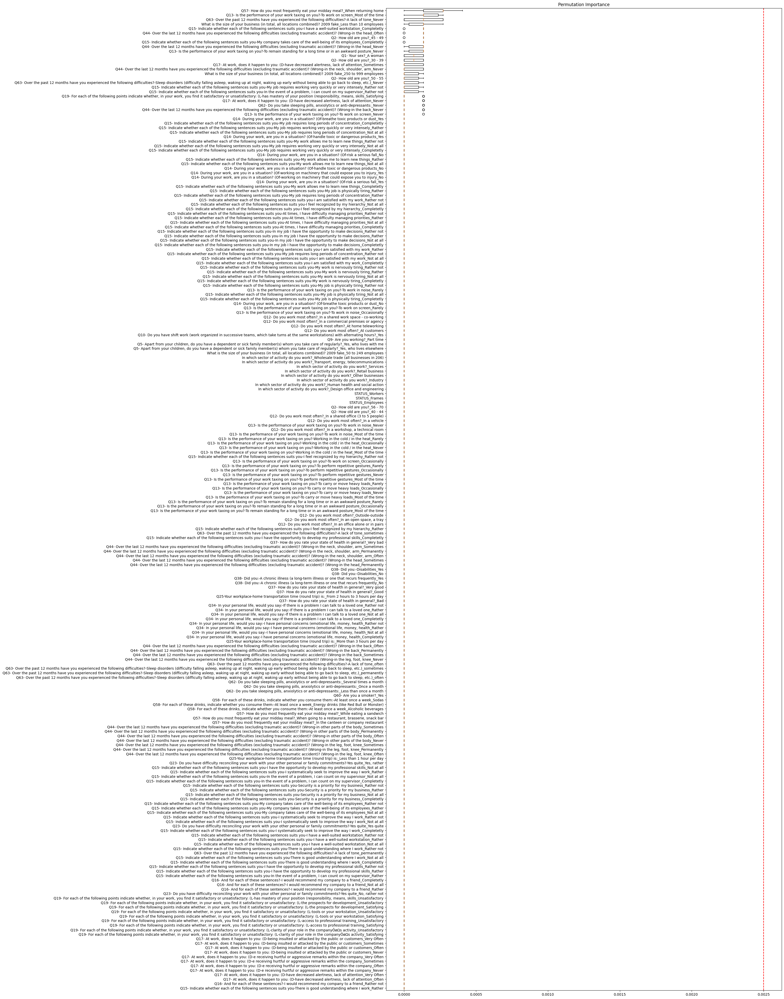

In [42]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()

### No SL Vs SSL

In [43]:
# get only the rows with outcome 0 and 2
data_02 = data[(data['outcome'] == 0) | (data['outcome'] == 2)] 

In [44]:
X = data_02.drop('outcome', axis=1)
# get the outcome column
y = data_02['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [45]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf2 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf2.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [46]:
# get the predictions
y_pred = clf2.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=2)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.888084078966056
[[6248    0]
 [ 788    5]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      6248
           2       1.00      0.01      0.01       793

    accuracy                           0.89      7041
   macro avg       0.94      0.50      0.48      7041
weighted avg       0.90      0.89      0.84      7041

0.5031525851197982
[0. 0. 1.] [0.         0.00630517 1.        ] [3 2 0]


0.5031525851197982

In [47]:
# get the permutation importance
perm_importance = permutation_importance(clf2, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

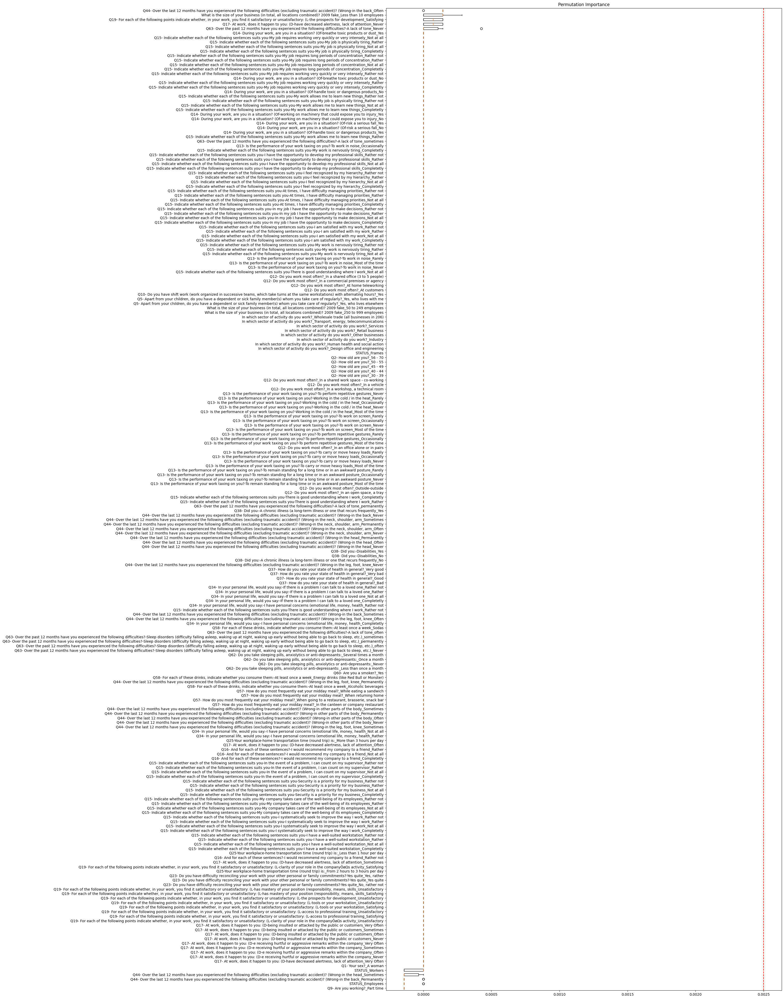

In [48]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()

### No SL vs LSL

In [49]:
# get only the rows with outcome 0 and 3
data_03 = data[(data['outcome'] == 0) | (data['outcome'] == 3)] 

In [50]:
X = data_03.drop('outcome', axis=1)
# get the outcome column
y = data_03['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [51]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf3 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf3.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [52]:
# get the predictions
y_pred = clf3.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=3)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.8270341207349081
[[6145   58]
 [1260  157]]
              precision    recall  f1-score   support

           0       0.83      0.99      0.90      6203
           3       0.73      0.11      0.19      1417

    accuracy                           0.83      7620
   macro avg       0.78      0.55      0.55      7620
weighted avg       0.81      0.83      0.77      7620

0.5507235725286476
[0.         0.00935031 1.        ] [0.         0.11079746 1.        ] [4 3 0]


0.5507235725286476

In [53]:
# get the permutation importance
perm_importance = permutation_importance(clf3, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

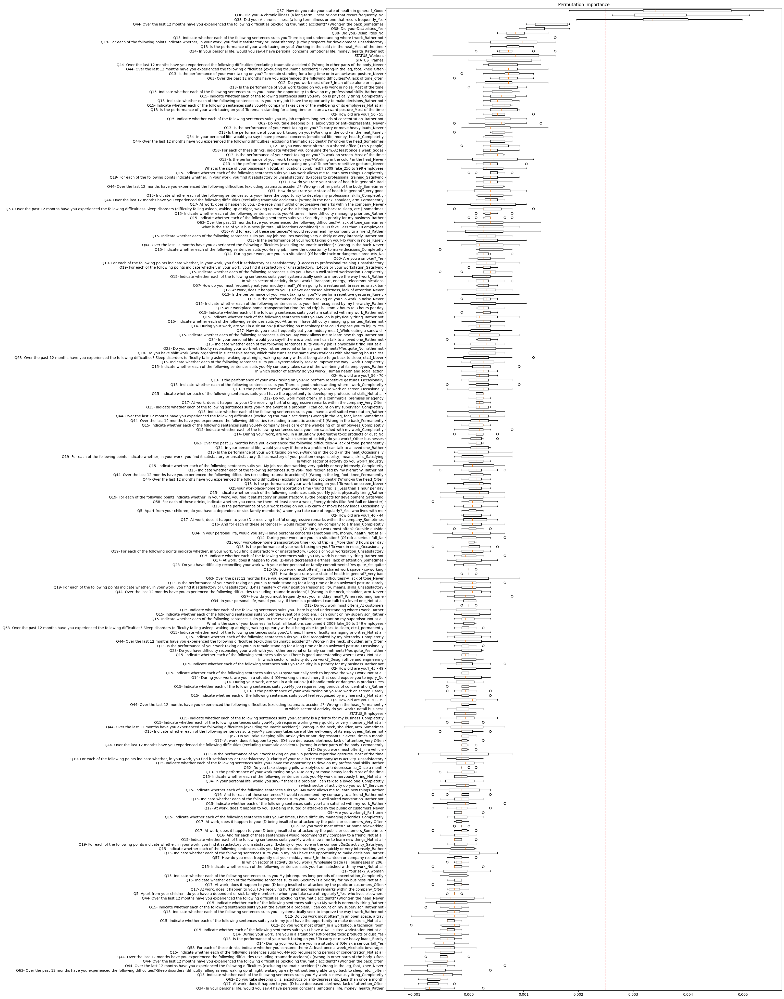

In [54]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()

### VSSL vs SSL

In [55]:
# get only the rows with outcome 1 and 2
data_12 = data[(data['outcome'] == 1) | (data['outcome'] == 2)] 

In [56]:
X = data_12.drop('outcome', axis=1)
# get the outcome column
y = data_12['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [57]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf12 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf12.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [58]:
# get the predictions
y_pred = clf12.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=3)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.6060606060606061
[[965 123]
 [618 175]]
              precision    recall  f1-score   support

           1       0.61      0.89      0.72      1088
           2       0.59      0.22      0.32       793

    accuracy                           0.61      1881
   macro avg       0.60      0.55      0.52      1881
weighted avg       0.60      0.61      0.55      1881

0.5538147438988206
[0.         0.15842637 1.        ] [nan nan nan] [3 2 1]


nan

In [59]:
# get the permutation importance
perm_importance = permutation_importance(clf12, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

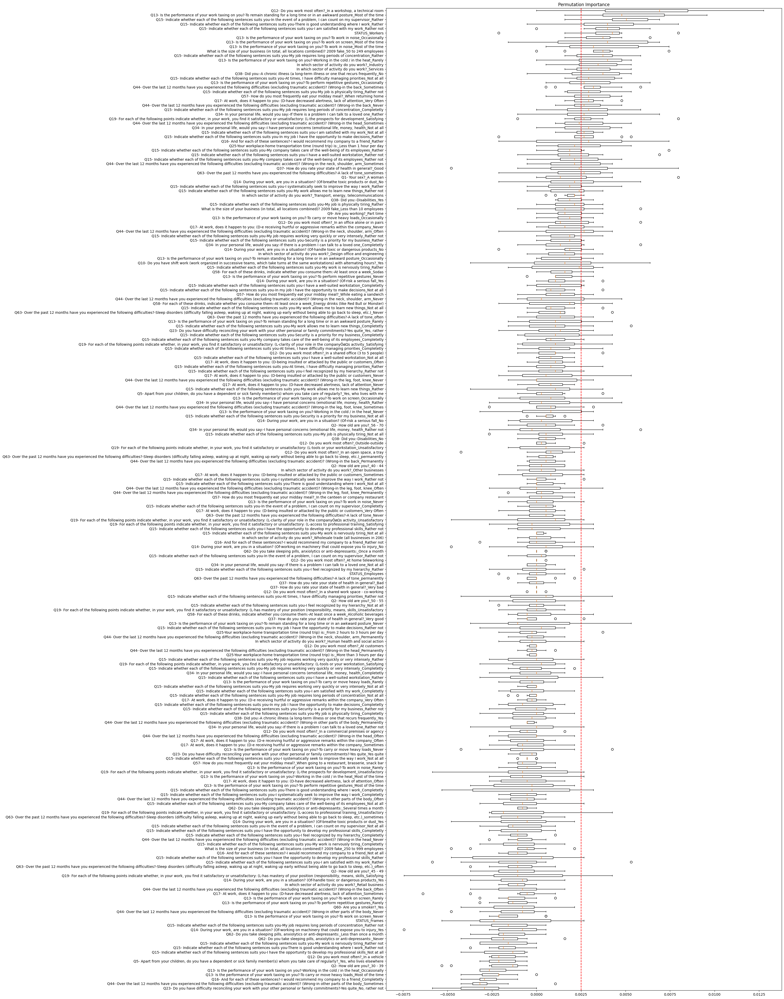

In [60]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()

### VSSL VS LSH

In [61]:
# get only the rows with outcome 1 and 3
data_13 = data[(data['outcome'] == 1) | (data['outcome'] == 3)] 

In [62]:
X = data_13.drop('outcome', axis=1)
# get the outcome column
y = data_13['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [63]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf13 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf13.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [64]:
# get the predictions
y_pred = clf13.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=3)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.7036585365853658
[[ 702  415]
 [ 314 1029]]
              precision    recall  f1-score   support

           1       0.69      0.63      0.66      1117
           3       0.71      0.77      0.74      1343

    accuracy                           0.70      2460
   macro avg       0.70      0.70      0.70      2460
weighted avg       0.70      0.70      0.70      2460

0.6973320996632961
[0.         0.37153089 1.        ] [0.         0.76619509 1.        ] [4 3 1]


0.6973320996632961

In [65]:
# get the permutation importance
perm_importance = permutation_importance(clf13, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

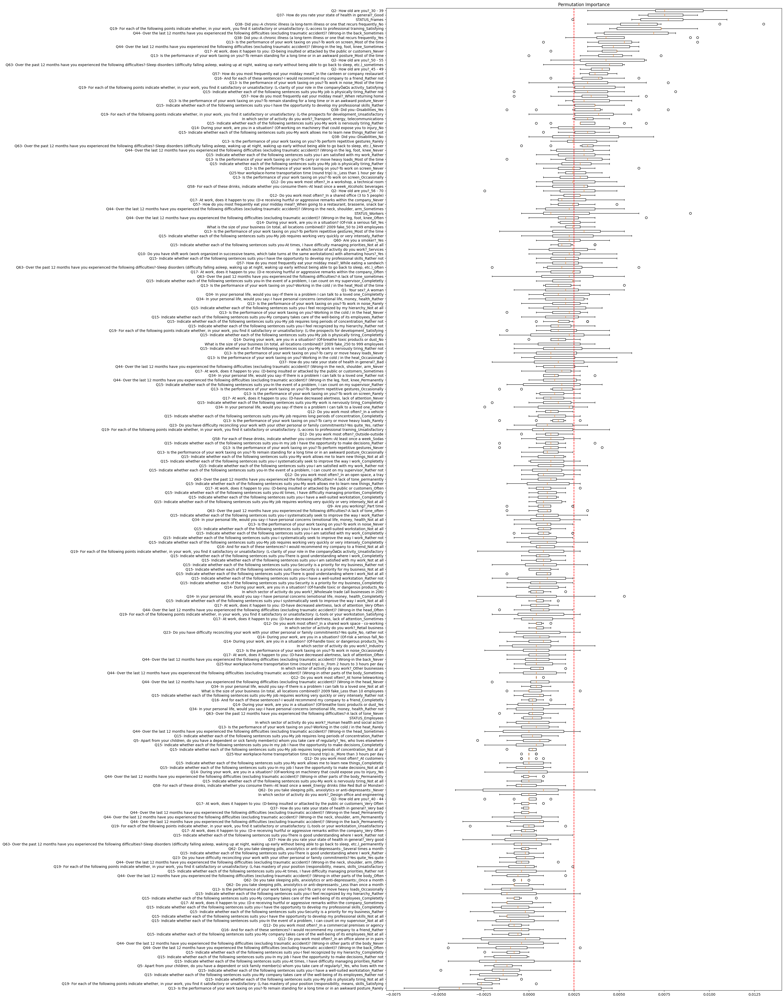

In [66]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()

### SSL vs LSL

In [67]:
# get only the rows with outcome 2 and 3
data_23 = data[(data['outcome'] == 2) | (data['outcome'] == 3)] 

In [68]:
X = data_23.drop('outcome', axis=1)
# get the outcome column
y = data_23['outcome']

# split the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [69]:
# random forest algorithm using conditional inference trees and variable importance using an AUC-based permutation measure

# create a random forest classifier
clf23 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced_subsample')

# fit the classifier to the training data
clf23.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=42)

In [70]:
# get the predictions
y_pred = clf13.predict(X_test)

# get the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

# get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# get the classification report
class_report = classification_report(y_test, y_pred)
print(class_report)

# get the roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred, average='macro')
print(roc_auc)

# get the fpr, tpr and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=3)
print(fpr, tpr, thresholds)

# get the auc
auc_score = auc(fpr, tpr)
auc_score

0.6044318717586045
[[   0    0    0]
 [ 296    0  457]
 [  86    0 1282]]
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00       753
           3       0.74      0.94      0.83      1368

    accuracy                           0.60      2121
   macro avg       0.25      0.31      0.28      2121
weighted avg       0.48      0.60      0.53      2121

0.6651143962163044
[0.         0.60690571 1.        ] [0.        0.9371345 1.       ] [4 3 1]


0.6651143962163044

In [71]:
# get the permutation importance
perm_importance = permutation_importance(clf23, X_test, y_test, n_repeats=10, random_state=42)

# get the sorted indices of the permutation importance
sorted_idx = perm_importance.importances_mean.argsort()

# get the feature names
feature_names = X_test.columns

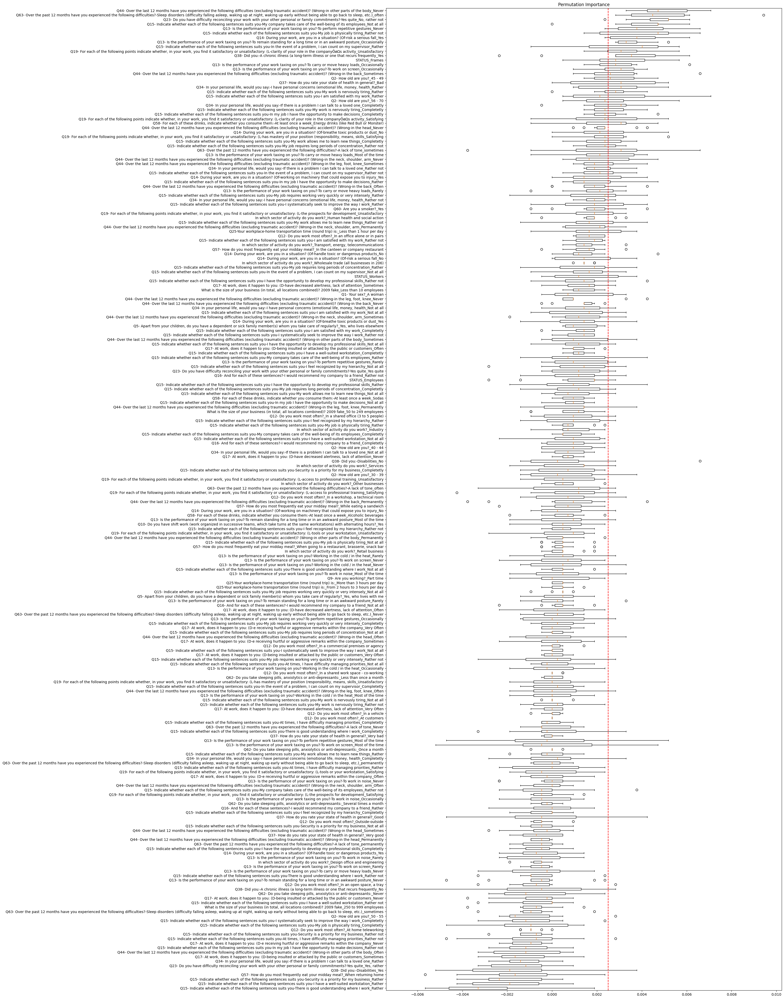

In [72]:
# plot the permutation importance
plt.figure(figsize=(20, 50))
plt.boxplot(perm_importance.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
# dotted line represents 0.0025 importance
plt.axvline(x=0.0025, color='r', linestyle='--')
plt.title("Permutation Importance")
plt.show()